# CAPSTONE III

# 

# I-Data Wrangling


This step consists of multiple components including Data Collection, Data Organization, Data Definitions, and Data Cleaning.  

## Data Collection

In [2]:
import os 
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
from sklearn.model_selection import train_test_split
import plotly.graph_objects as go
import plotly.express as px

Let us print the current working directory and change it if necessary

In [5]:
path=os.getcwd()
print(path)

C:\Users\meteu\Desktop\Desktop data\data analytic with VA TCH\Machine Learning


In [6]:
path="C:/Users/meteu/Desktop/SPRINGBOARD/PROJECT 3"

In [7]:
print(os.chdir(path))

None


In [8]:
os.listdir(path)

['0.7', '2.1', 'age_gender.csv', 'data', 'FastAI', 'figures', 'models']

Let us load the data into a pandas dataframe

In [9]:
df=pd.read_csv("age_gender.csv", sep=',')
df.head()

,age,ethnicity,gender,img_name,pixels
0,1,2,0,20161219203650636.jpg.chip.jpg,129 128 128 126 127 130 133 135 139 142 145 14...
1,1,2,0,20161219222752047.jpg.chip.jpg,164 74 111 168 169 171 175 182 184 188 193 199...
2,1,2,0,20161219222832191.jpg.chip.jpg,67 70 71 70 69 67 70 79 90 103 116 132 145 155...
3,1,2,0,20161220144911423.jpg.chip.jpg,193 197 198 200 199 200 202 203 204 205 208 21...
4,1,2,0,20161220144914327.jpg.chip.jpg,202 205 209 210 209 209 210 211 212 214 218 21...


## Data Organization

### Let us create some subfolders inside my project folder

<font color='green'> **Creation of a subfolder called `data`.**</font>

In [14]:
!mkdir data

<font color='green'> **Creation of a subfolder for the data visualizations called `figures`.**</font>

In [15]:
!mkdir figures

<font color='green'> **Creation of a folder for the models we will build called `models`.**</font>

In [16]:
!mkdir models

Let us see what we have therefore in our project folder

In [17]:
!dir

 Volume in drive C is Windows
 Volume Serial Number is 603D-12C6

 Directory of C:\Users\meteu\Desktop\SPRINGBOARD\PROJECT 3

11/16/2020  09:24 AM    <DIR>          .
11/16/2020  09:24 AM    <DIR>          ..
11/16/2020  08:58 AM       199,745,942 age_gender.csv
11/16/2020  09:23 AM    <DIR>          data
11/16/2020  09:23 AM    <DIR>          figures
11/16/2020  09:24 AM    <DIR>          models
               1 File(s)    199,745,942 bytes
               5 Dir(s)  317,857,837,056 bytes free


## Data Definition

### Column Names

In [7]:
df.columns

Index(['age', 'ethnicity', 'gender', 'img_name', 'pixels'], dtype='object')

### Data Types

In [8]:
df.dtypes

age           int64
ethnicity     int64
gender        int64
img_name     object
pixels       object
dtype: object

In [9]:
df.shape

(23705, 5)

In [279]:
df.pixels[1].shape

(48, 48)

### Description of the column

Let us find per column the count of non-null values.

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23705 entries, 0 to 23704
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        23705 non-null  int64 
 1   ethnicity  23705 non-null  int64 
 2   gender     23705 non-null  int64 
 3   img_name   23705 non-null  object
 4   pixels     23705 non-null  object
dtypes: int64(3), object(2)
memory usage: 926.1+ KB


There is no non-null value in the datset.

Let us see the dataset's summary statistics

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,23705.0,33.300907,19.885708,1.0,23.0,29.0,45.0,116.0
ethnicity,23705.0,1.269226,1.345638,0.0,0.0,1.0,2.0,4.0
gender,23705.0,0.477283,0.499494,0.0,0.0,0.0,1.0,1.0


### Count of unique values or codes

In [12]:
df.count()

age          23705
ethnicity    23705
gender       23705
img_name     23705
pixels       23705
dtype: int64

## Data Cleaning

Let us check if there are missing values

In [13]:
df.isnull().sum()

age          0
ethnicity    0
gender       0
img_name     0
pixels       0
dtype: int64

We can see that there is no missing value in the dataset.

Let us check if there are any duplicate row in our dataset

In [14]:
dupli=df.duplicated()
j=0
for i in dupli:
    if i==True:
        j=j+1
print('The number of duplicated rows are', j)


The number of duplicated rows are 0


We have zero duplicates rows, which shows us that our data is clean.

# II-EXPLORATORY DATA ANALYSIS

In [13]:
#Let us convert pixels into numpy array
df['pixels']=df['pixels'].apply(lambda x: np.array(x.split(), dtype="float32").reshape(48, 48))
df['pixels']

0        [[129.0, 128.0, 128.0, 126.0, 127.0, 130.0, 13...
1        [[164.0, 74.0, 111.0, 168.0, 169.0, 171.0, 175...
2        [[67.0, 70.0, 71.0, 70.0, 69.0, 67.0, 70.0, 79...
3        [[193.0, 197.0, 198.0, 200.0, 199.0, 200.0, 20...
4        [[202.0, 205.0, 209.0, 210.0, 209.0, 209.0, 21...
                               ...                        
23700    [[127.0, 100.0, 94.0, 81.0, 77.0, 77.0, 74.0, ...
23701    [[23.0, 28.0, 32.0, 35.0, 42.0, 47.0, 68.0, 85...
23702    [[59.0, 50.0, 37.0, 40.0, 34.0, 19.0, 30.0, 10...
23703    [[45.0, 108.0, 120.0, 156.0, 206.0, 197.0, 140...
23704    [[156.0, 161.0, 160.0, 165.0, 170.0, 173.0, 16...
Name: pixels, Length: 23705, dtype: object

In [14]:
type(df['pixels'])


pandas.core.series.Series

In [15]:
#We normalize the pixels data
df['pixels']=df['pixels'].apply(lambda x: x/255)
df['pixels'].head()

0    [[0.5058824, 0.5019608, 0.5019608, 0.49411765,...
1    [[0.6431373, 0.2901961, 0.43529412, 0.65882355...
2    [[0.2627451, 0.27450982, 0.2784314, 0.27450982...
3    [[0.75686276, 0.77254903, 0.7764706, 0.7843137...
4    [[0.7921569, 0.8039216, 0.81960785, 0.8235294,...
Name: pixels, dtype: object

Let us plot the age distribution

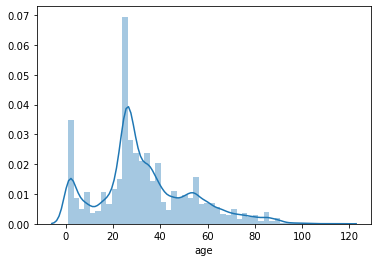

In [16]:
sns.distplot(df['age'])

Let us plot the ethnicity distribution

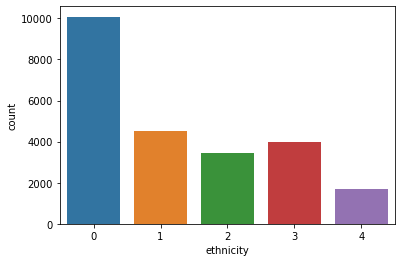

In [17]:
sns.countplot(df['ethnicity'])

Let us check how many black people we have in our dataset and the percentage.

In [18]:
a=df['ethnicity'].value_counts()[1]
a

4526

In [19]:
b=df.shape[0]
b

23705

In [20]:
print('The percentage of black in the dataset is ', 100*a/b, '%')

The percentage of black in the dataset is  19.093018350558953 %


Let us check the gender distribution.

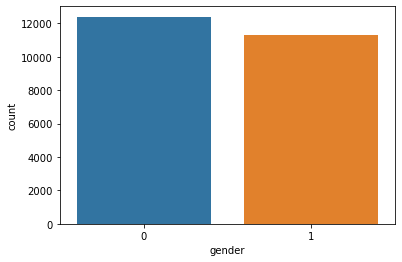

In [21]:
sns.countplot(df['gender'])

We can see that we have more male than female

Let us try to visualize some of the image in this dataset. By displaying faces and genders we will be ablle to identify any anomaly in labeling the data.

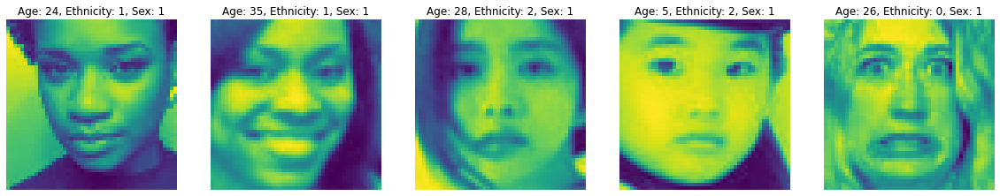

In [22]:
# Plot some pictures
fig, axes = plt.subplots(1, 5, figsize=(20, 10))

for i in range(5):
    random_face = np.random.choice(len(df))
    
    age = df['age'][random_face]
    ethnicity = df['ethnicity'][random_face]
    gender = df['gender'][random_face]
    
    axes[i].set_title('Age: {0}, Ethnicity: {1}, Sex: {2}'.format(age, ethnicity, gender))
    axes[i].imshow(df['pixels'][random_face])
    axes[i].axis('off')

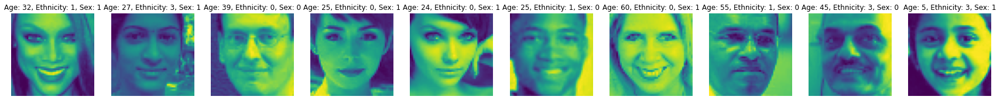

In [23]:
fig, axes=plt.subplots(1,10, figsize=(30, 20))
for i in range(10):
    face=np.random.choice(len(df))
    age=df['age'][face]
    ethnicity=df['ethnicity'][face]
    gender=df['gender'][face]
    axes[i].set_title('Age: {0}, Ethnicity: {1}, Sex: {2}'.format(age, ethnicity, gender))
    axes[i].imshow(df['pixels'][face])
    axes[i].axis('off')    

# III-Pre_processing and Training Data Development

In [24]:
X=np.array(df['pixels'].tolist())

In [25]:
X.shape

(23705, 48, 48)

In [26]:
#let us convert our image from 1D to 3D
X=X.reshape(X.shape[0], 48, 48, 1)
X.shape

(23705, 48, 48, 1)

In [27]:
y=np.array(df['age'])

In [28]:
y.shape

(23705,)

In [29]:
#let us split our data into train and test set
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.2, random_state=42)

In [2]:
#Let us install Tensorflow 2
!pip install tensorflow

  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4835 sha256=02d325c19dceb6ae6f288065fd3117abd8bb6dc711617878c34d9e1b04404dc9
  Stored in directory: c:\users\meteu\appdata\local\pip\cache\wheels\3f\e3\ec\8a8336ff196023622fbcb36de0c5a5c218cbb24111d1d4c7f2
Successfully built termcolor


In [31]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,InputLayer, Dropout, BatchNormalization, Flatten, Dense, MaxPooling2D

In [218]:
#Here we check the TensorFlow version
tf.__version__

'2.3.1'

In [219]:
#We also check the keras version
keras.__version__

'2.4.0'

In [220]:
df.shape[1]

5

In [32]:
Model=tf.keras.Sequential([
    L.InputLayer(input_shape=(48,48,1)),
    L.Conv2D(64, (3,3), activation='relu', input_shape=(32,32,3), padding='same'),
    L.BatchNormalization(),
    L.MaxPooling2D((2,2)),
    L.Dropout(rate=0.3),
    L.MaxPooling2D((2,2)),
    L.Conv2D(256, (3,3), activation='relu', padding='same'),
    L.MaxPooling2D((2,2)),
    L.Dropout(rate=0.5),
    L.BatchNormalization(),
    L.Flatten(),
    L.Dense(512, activation='relu'),
    L.Dropout(rate=0.5),
    L.Dense(256, activation='relu'),
    L.Dropout(rate=0.5),
    L.Dense(1)
])

Model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

In [33]:
## Stop training when validation loss reach 0.2700
class myCallback (tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if (logs.get('val_loss')<0.27):
            print("\nReached 0.2700 val_loss so cancelling training!")
            self.model.stop_training=True
            
callback=myCallback()

In [34]:
Model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 48, 48, 64)        640       
_________________________________________________________________
batch_normalization (BatchNo (None, 48, 48, 64)        256       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 24, 24, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 24, 24, 64)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 12, 12, 256)       147712    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 6, 6, 256)         0

In [152]:
history=Model.fit(X_train, y_train, epochs=20, validation_split=0.1, batch_size=64, callbacks=[callback])


Epoch 1/20
267/267 [==============================] - 74s 276ms/step - loss: 33.8035 - mae: 4.2765 - val_loss: 106.2724 - val_mae: 7.1763
Epoch 2/20
267/267 [==============================] - 76s 286ms/step - loss: 33.8644 - mae: 4.2450 - val_loss: 174.2755 - val_mae: 8.7710
Epoch 3/20
267/267 [==============================] - 77s 288ms/step - loss: 34.5001 - mae: 4.3054 - val_loss: 450.9449 - val_mae: 9.1417
Epoch 4/20
267/267 [==============================] - 76s 286ms/step - loss: 34.7026 - mae: 4.3035 - val_loss: 137.8499 - val_mae: 8.3528
Epoch 5/20
267/267 [==============================] - 76s 286ms/step - loss: 34.4296 - mae: 4.2569 - val_loss: 214.6763 - val_mae: 8.4356
Epoch 6/20
267/267 [==============================] - 77s 288ms/step - loss: 34.7392 - mae: 4.3239 - val_loss: 139.4687 - val_mae: 6.9718
Epoch 7/20
267/267 [==============================] - 76s 285ms/step - loss: 32.8084 - mae: 4.2168 - val_loss: 1122.5361 - val_mae: 13.8549
Epoch 8/20
267/267 [============

In [181]:
history1=Model.fit(X_test, y_test, epochs=20, validation_split=0.1, batch_size=64, callbacks=[callback])

Epoch 1/20
67/67 [==============================] - 16s 235ms/step - loss: 96.2818 - mae: 7.0152 - val_loss: 392.0956 - val_mae: 10.6323
Epoch 2/20
67/67 [==============================] - 20s 295ms/step - loss: 87.8606 - mae: 6.7474 - val_loss: 11248.7461 - val_mae: 40.2265
Epoch 3/20
67/67 [==============================] - 19s 285ms/step - loss: 76.2605 - mae: 6.3962 - val_loss: 159.9756 - val_mae: 8.7910
Epoch 4/20
67/67 [==============================] - 19s 287ms/step - loss: 73.8686 - mae: 6.2842 - val_loss: 7737.0718 - val_mae: 32.3412
Epoch 5/20
67/67 [==============================] - 19s 283ms/step - loss: 67.9100 - mae: 6.1048 - val_loss: 130.6725 - val_mae: 7.8159
Epoch 6/20
67/67 [==============================] - 19s 285ms/step - loss: 65.5046 - mae: 5.9803 - val_loss: 185.7814 - val_mae: 9.7116
Epoch 7/20
67/67 [==============================] - 19s 290ms/step - loss: 62.8281 - mae: 5.8570 - val_loss: 80.8988 - val_mae: 6.5014
Epoch 8/20
67/67 [=========================

Let us evaluate the training history

In [134]:
!pip install plotly

  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11435 sha256=ba94eaa82bf6d79c429871682e7a03738b29caf067ad34645e173d4f3d802910
  Stored in directory: c:\users\meteu\appdata\local\pip\cache\wheels\f9\8d\8d\f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying


In [139]:
!pip install cufflinks

  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=68729 sha256=85ce7651416b505081d88ab1f2c74394033359ac28142f7018c416ab870efd34
  Stored in directory: c:\users\meteu\appdata\local\pip\cache\wheels\e1\27\13\3fe67fa7ea7be444b831d117220b3b586b872c9acd4df480d0
Successfully built cufflinks


In [36]:
import plotly.graph_objects as go
import plotly.express as px

In [153]:
history.history

{'loss': [33.80352020263672,
  33.864383697509766,
  34.5001106262207,
  34.70256042480469,
  34.42961502075195,
  34.73920822143555,
  32.80840301513672,
  33.61810302734375,
  34.01918029785156,
  33.210670471191406,
  33.2442626953125,
  32.54663848876953,
  33.98293685913086,
  33.48950958251953,
  30.93489646911621,
  31.649959564208984,
  32.955657958984375,
  32.25230026245117,
  31.44350242614746,
  32.12926483154297],
 'mae': [4.276488304138184,
  4.245037078857422,
  4.305416107177734,
  4.303512096405029,
  4.2569427490234375,
  4.323914051055908,
  4.216840744018555,
  4.256683826446533,
  4.249673843383789,
  4.195097923278809,
  4.21176815032959,
  4.195544242858887,
  4.236553192138672,
  4.244099140167236,
  4.083600044250488,
  4.13297176361084,
  4.193385124206543,
  4.143396854400635,
  4.110056400299072,
  4.162780284881592],
 'val_loss': [106.27242279052734,
  174.27548217773438,
  450.9449157714844,
  137.8498992919922,
  214.67626953125,
  139.4687042236328,
  11

In [186]:
history1.history

{'loss': [96.2818374633789,
  87.86063385009766,
  76.26051330566406,
  73.86856079101562,
  67.91004180908203,
  65.50462341308594,
  62.82807540893555,
  57.799015045166016,
  58.12013244628906,
  54.461185455322266,
  53.216739654541016,
  52.54428482055664,
  51.212650299072266,
  48.978302001953125,
  49.439849853515625,
  44.8175048828125,
  44.003501892089844,
  45.14701461791992,
  42.5470085144043,
  42.82671356201172],
 'mae': [7.015163421630859,
  6.7474141120910645,
  6.396246433258057,
  6.284178256988525,
  6.104764938354492,
  5.980301380157471,
  5.856984615325928,
  5.713045597076416,
  5.612651348114014,
  5.552004814147949,
  5.42798376083374,
  5.348902702331543,
  5.292666435241699,
  5.240719318389893,
  5.235415935516357,
  4.98964786529541,
  4.9273481369018555,
  4.998608112335205,
  4.911461353302002,
  4.883973121643066],
 'val_loss': [392.0955505371094,
  11248.74609375,
  159.9756317138672,
  7737.07177734375,
  130.6725311279297,
  185.78138732910156,
  80

In [154]:
hist=pd.DataFrame(history.history)
hist

,loss,mae,val_loss,val_mae
0,33.803520,4.276488,106.272423,7.176252
1,33.864384,4.245037,174.275482,8.770995
2,34.500111,4.305416,450.944916,9.141685
3,34.702560,4.303512,137.849899,8.352807
4,34.429615,4.256943,214.676270,8.435573
5,34.739208,4.323914,139.468704,6.971811
6,32.808403,4.216841,1122.536133,13.854897
7,33.618103,4.256684,181.993637,9.202152
8,34.019180,4.249674,133.261978,8.560560
9,33.210670,4.195098,80.454185,6.342760


In [187]:
hist1=pd.DataFrame(history1.history)
hist1

,loss,mae,val_loss,val_mae
0,96.281837,7.015163,392.095551,10.632345
1,87.860634,6.747414,11248.746094,40.226513
2,76.260513,6.396246,159.975632,8.791003
3,73.868561,6.284178,7737.071777,32.341171
4,67.910042,6.104765,130.672531,7.815869
5,65.504623,5.980301,185.781387,9.711631
6,62.828075,5.856985,80.898796,6.501357
7,57.799015,5.713046,143.672638,8.487989
8,58.120132,5.612651,113.572464,7.487446
9,54.461185,5.552005,108.410652,7.437151


In [194]:
hist_train1=hist.drop(['val_loss', 'val_mae','loss'], axis=1)


In [195]:
hist_test1=hist1.drop(['val_loss', 'val_mae', 'loss'], axis=1)

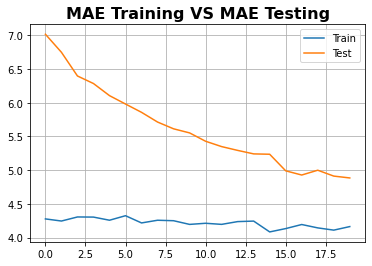

In [206]:
plt.plot(hist_train1, label="Train")
plt.plot(hist_test1, label="Test")
plt.legend(loc='upper right')
plt.grid(True)
plt.title("MAE Training VS MAE Testing", fontsize=16, fontweight='bold')
plt.show()

In [207]:
hist_train2=hist.drop(['val_loss', 'val_mae','mae'], axis=1)
hist_test2=hist.drop(['val_loss', 'val_mae','mae'], axis=1)

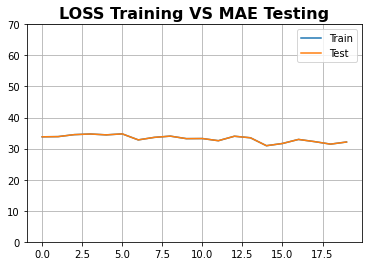

In [220]:
plt.plot(hist_train2, label="Train")
plt.plot(hist_test2, label="Test")
plt.legend(loc='upper right')
plt.grid(True)
plt.title("LOSS Training VS MAE Testing", fontsize=16, fontweight='bold')
plt.gca().set_ylim(0,70)
plt.show()

Let us avaluate our model on the test set

In [170]:
Model.evaluate(X_test, y_test)

149/149 [==============================] - 3s 21ms/step - loss: 155.2118 - mae: 9.4314


[155.21182250976562, 9.431405067443848]

Let us use our model to make some prediction

In [171]:
y_pred=Model.predict(X_test)

In [172]:
y_pred

array([[45.459663 ],
       [34.126404 ],
       [10.521191 ],
       ...,
       [ 6.4327745],
       [71.78255  ],
       [61.38594  ]], dtype=float32)

In [173]:
def plot(X,y):
    plt.title(y)
    plt.imshow(X.reshape(48,48))
    plt.show()

C:\Users\meteu\anaconda3\lib\site-packages\matplotlib\text.py:1165: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



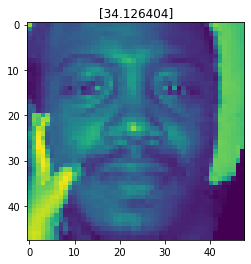

In [174]:
plot(X_test[1], y_pred[1])

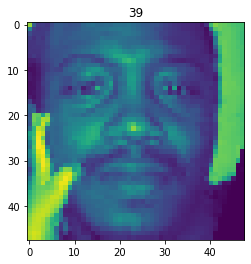

In [175]:
plot(X_test[1], y_test[1])

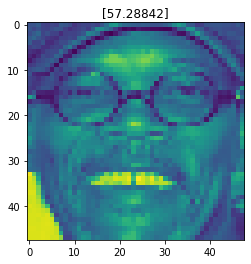

In [176]:
plot(X_test[7], y_pred[7])

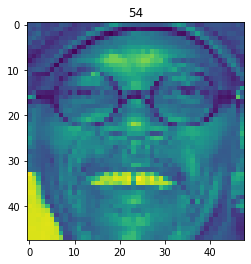

In [177]:
plot(X_test[7], y_test[7])

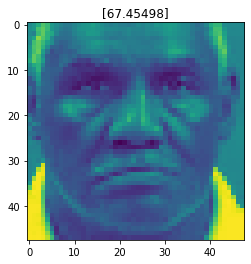

In [178]:
plot(X_test[9], y_pred[9])

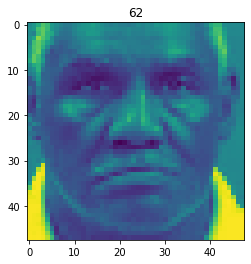

In [179]:
plot(X_test[9], y_test[9])

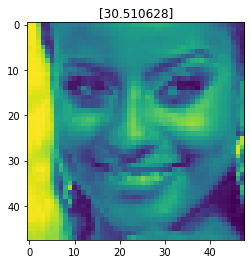

In [261]:
plot(X_test[47], y_pred[47])

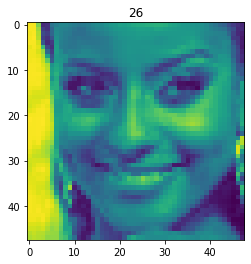

In [262]:
plot(X_test[47], y_test[47])

In [ ]:
Our next step will be to predict my father age

In [191]:
# load the image
image = Image.open('papa.jpg')

In [192]:
# convert image to numpy array
data = asarray(image)

In [185]:
# summarize some details about the image
print(image.format)
print(image.mode)
print(image.size)
# show the image
image.show()

JPEG
RGB
(4608, 3456)


In [171]:
# create Pillow image
image2 = Image.fromarray(data)

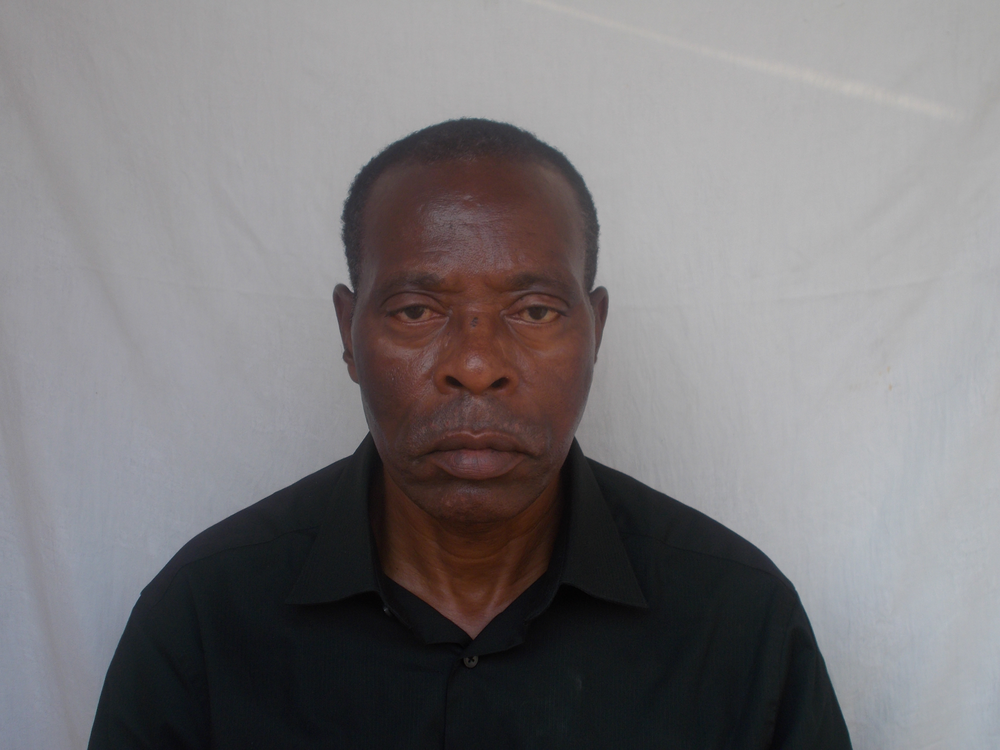

In [172]:
image2

In [196]:
data

array([[[147, 143, 144],
        [144, 140, 141],
        [144, 140, 141],
        ...,
        [167, 167, 167],
        [167, 167, 167],
        [169, 169, 169]],

       [[150, 146, 147],
        [146, 142, 143],
        [144, 140, 141],
        ...,
        [168, 168, 168],
        [168, 168, 168],
        [168, 168, 168]],

       [[146, 142, 143],
        [146, 142, 143],
        [145, 141, 142],
        ...,
        [167, 167, 167],
        [168, 168, 168],
        [167, 167, 167]],

       ...,

       [[129, 130, 150],
        [128, 131, 150],
        [127, 130, 149],
        ...,
        [160, 170, 179],
        [160, 171, 177],
        [160, 171, 177]],

       [[129, 130, 151],
        [129, 130, 150],
        [127, 130, 149],
        ...,
        [160, 170, 179],
        [160, 171, 177],
        [160, 171, 177]],

       [[130, 131, 152],
        [130, 131, 151],
        [129, 132, 151],
        ...,
        [161, 171, 180],
        [160, 171, 177],
        [160, 171, 177]]

In [200]:
data.shape

(3456, 4608, 3)

In [201]:
df['pixels'].shape

(23705,)

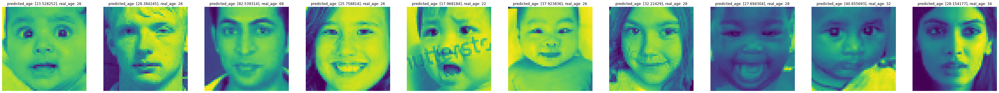

In [180]:
fig, axes=plt.subplots(1,10, figsize=(60, 30))
for i in range(10):
    face=np.random.choice(len(X_test))
    predicted_age=y_pred[face]
    real_age=y_test[face]    
    axes[i].set_title('predicted_age: {0}, real_age: {1}'.format(predicted_age, real_age))
    axes[i].imshow(df['pixels'][face])
    axes[i].axis('off')    

In [ ]:
def plot(X,y):
    plt.title(y)
    plt.imshow(X.reshape(48,48))
    plt.show()

In [ ]:
plot(X_test[1], y_pred[1])